https://github.com/jimrybarski/nd2reader

https://rbnvrw.github.io/nd2reader/tutorial.html

In [17]:
import nd2reader
import matplotlib.pyplot as plt
import os
import numpy as np
from os import listdir
from PIL import Image
import shutil

In [18]:
PATH = 'data/'

def read_data(reader,PATH):
    data = []
    filenames = []
    for filename in listdir(PATH):
        if filename.endswith('.nd2'):
            data.append(reader(PATH + filename))
            filenames.append(filename)
    return data, filenames

In [19]:
reader = nd2reader.ND2Reader
samples, filenames = read_data(reader, PATH)
print("In total {} files:".format(len(filenames)))
print(*filenames, sep="\n")

In total 9 files:
18112019_SJR5_w1_5ms.nd2
18112019_SJR5_w2_30ms.nd2
18112019_SJR5_w3_30ms.nd2
18112019_SJR5_w5_30ms.nd2
18112019_SJR5_w4_30ms.nd2
18112019_SJR5_w2_5ms.nd2
18112019_SJR5_w3_5ms.nd2
18112019_SJR5_w1_30ms.nd2
18112019_SJR5_w4_5ms.nd2


In [20]:
def get_volume(sample, channel, frame):
    if channel in range(sample.sizes["c"]) and frame in range(sample.sizes["t"]):
        sample.iter_axes = 'z'
        sample.default_coords['c'] = channel
        sample.default_coords['t'] = frame
        
        volume = np.array([np.array(level) for level in sample])
        return volume

In [21]:
volume_1 = get_volume(samples[0], channel=0, frame=0) # samples[0] refers to 5ms, which is noisier than 30ms
volume_2 = get_volume(samples[0], channel=0, frame=2)

### Analysis

#### Check pixel values

In [22]:
def print_matrix_stat(matrix):
    print("range: {} - {}; mean: {}".format(np.round(matrix.min(), 2),
                                            np.round(matrix.max(), 2), 
                                            np.round(matrix.mean(), 2)))

In [23]:
for level in volume_1:
    print_matrix_stat(level)

range: 80.0 - 134.0; mean: 106.46
range: 81.0 - 189.0; mean: 106.47
range: 77.0 - 204.0; mean: 106.48
range: 77.0 - 313.0; mean: 106.64
range: 81.0 - 311.0; mean: 106.7
range: 77.0 - 352.0; mean: 106.78
range: 79.0 - 393.0; mean: 107.0
range: 78.0 - 319.0; mean: 107.05
range: 71.0 - 253.0; mean: 107.16
range: 60.0 - 248.0; mean: 107.26
range: 70.0 - 288.0; mean: 107.26
range: 80.0 - 249.0; mean: 107.19
range: 68.0 - 219.0; mean: 107.14
range: 74.0 - 269.0; mean: 107.14
range: 49.0 - 260.0; mean: 107.02
range: 66.0 - 222.0; mean: 106.87
range: 48.0 - 211.0; mean: 106.74
range: 80.0 - 191.0; mean: 106.83
range: 81.0 - 192.0; mean: 106.77
range: 40.0 - 195.0; mean: 106.79
range: 80.0 - 200.0; mean: 106.87
range: 80.0 - 173.0; mean: 106.83
range: 81.0 - 164.0; mean: 106.73
range: 81.0 - 141.0; mean: 106.6
range: 80.0 - 144.0; mean: 106.59
range: 77.0 - 155.0; mean: 106.53
range: 79.0 - 154.0; mean: 106.52
range: 76.0 - 162.0; mean: 106.59
range: 79.0 - 142.0; mean: 106.6
range: 78.0 - 140.

## Set of images which we will use as benchmarks

In [24]:
volume = get_volume(samples[0], channel=0, frame=0)
img_1 = volume[10]

In [25]:
volume = get_volume(samples[1], channel=1, frame=0)
img_2 = volume[27]

In [26]:
volume = get_volume(samples[1], channel=1, frame=0)
img_3 = volume[32]

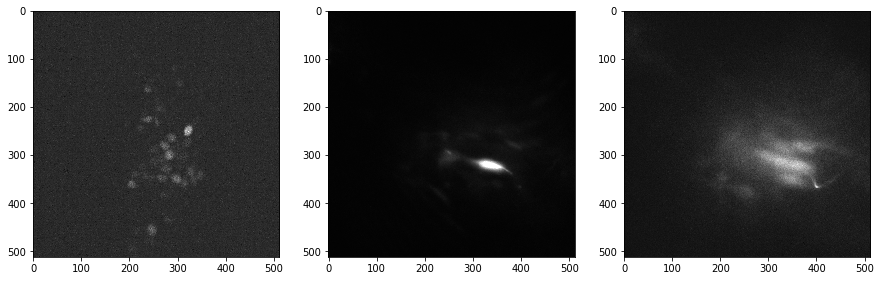

In [11]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 3, 1)
plt.imshow(img_1, cmap="gray")
plt.subplot(1, 3, 2)
plt.imshow(img_2, cmap="gray")
plt.subplot(1, 3, 3)
plt.imshow(img_3, cmap="gray")
plt.show()

In [70]:
benchmark_images = [img_1, img_2, img_3]

In [74]:
benchmark_images_path = "benchmark_image_set"

In [75]:
# # If cell returns access denied, run the cell again
# if os.path.isdir(benchmark_images_path):
#     shutil.rmtree(benchmark_images_path, ignore_errors=True)
os.mkdir(benchmark_images_path)

In [20]:
for i, image in enumerate(benchmark_images):
    fname = benchmark_images_path + "/image" + str(i) + ".jpg"
    plt.imsave(fname, image, cmap="gray")

#### Merge images

In [76]:
level = 10

img_1 = volume_1[level]
img_2 = volume_2[level]

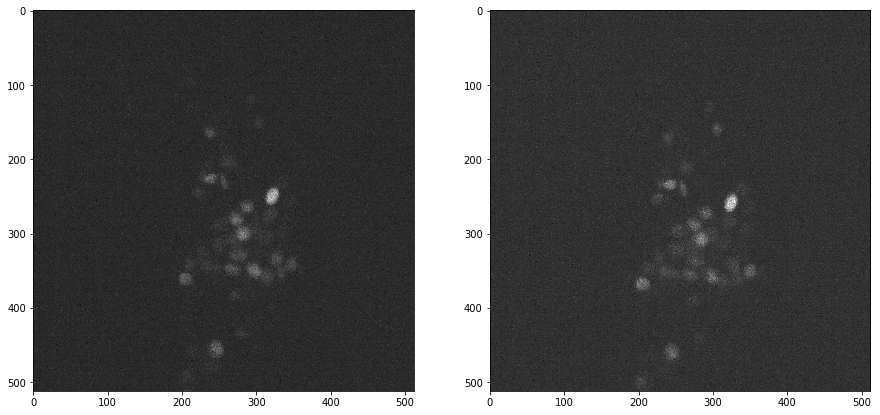

In [77]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(img_1, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_2, cmap="gray")
plt.show()

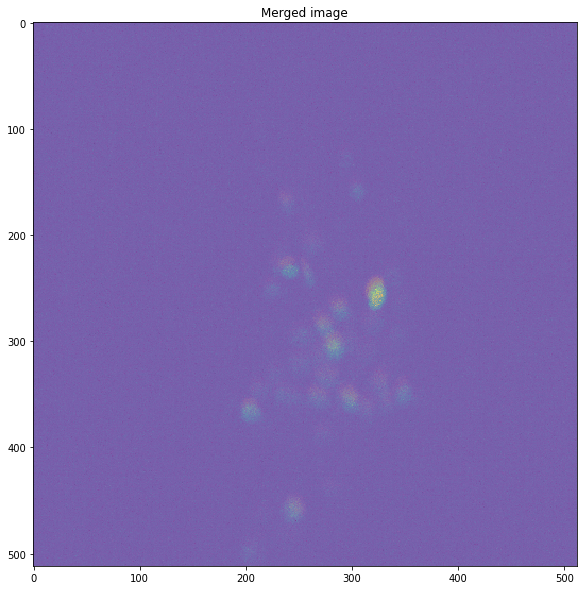

In [110]:
plt.figure(figsize=(10, 10))
plt.imshow(img_1, cmap="plasma", alpha=0.5)
plt.imshow(img_2, cmap="viridis", alpha=0.5)
plt.title("Merged image")
plt.show()

In [111]:
def get_similar_pixels(img1, img2, threshold=3):
    merged_image = np.abs(img_1 - img_2) <= threshold 
    return merged_image

In [120]:
merged_image = get_similar_pixels(img_1, img_2)
print("{}/{} ({}%) similar pixels".format(merged_image.sum(), 
                                         merged_image.size, 
                                         np.round(merged_image.sum() / merged_image.size * 100, 2)))

117938/262144 (44.99%) similar pixels


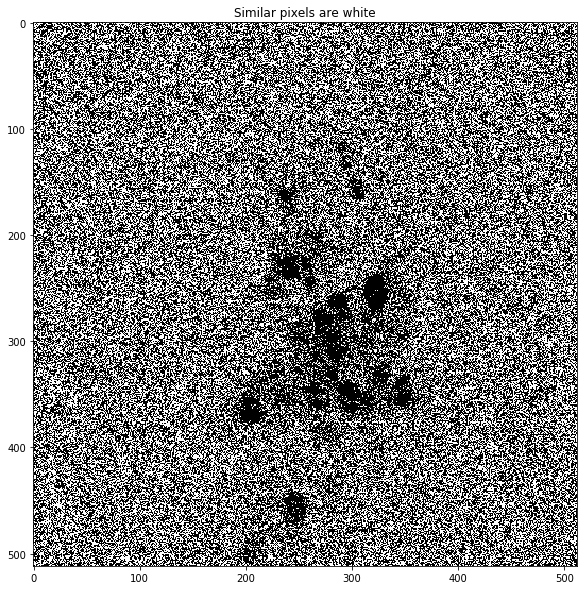

In [123]:
plt.figure(figsize=(10, 10))
plt.imshow(merged_image, cmap=plt.cm.gray)
plt.title("Similar pixels are white")
plt.show()

Let's try estimate mean value of similar points in two volumes, slice by slice

In [124]:
similar_pixels_perlevel = []
for level in range(len(volume_1)):
    merged_image = np.abs(volume_1[level] - volume_2[level]) <= 3
    similar_points_percent = np.round(merged_image.sum() / merged_image.size * 100, 2)
    similar_pixels_perlevel.append(similar_points_percent)

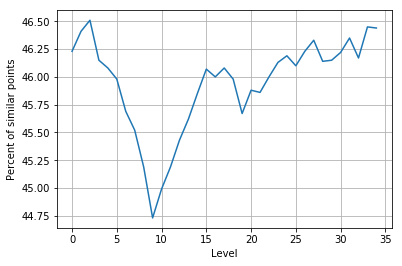

In [125]:
plt.plot(range(len(volume_1)), similar_pixels_perlevel)
plt.xlabel("Level")
plt.ylabel("Percent of similar points")
plt.grid()
plt.show()

### Image registration 

In [127]:
# !pip install opencv-python

In [128]:
import cv2

#### Finding shift

In [129]:
from skimage import data
from skimage.feature import register_translation
from skimage.feature.register_translation import _upsampled_dft
from scipy.ndimage import fourier_shift

In [130]:
shift, error, diffphase = register_translation(img_1, img_2) # pixel precision
print(shift, error, diffphase)

[-8. -2.] 0.06592309973983629 -3.8996541912810944e-19


In [131]:
shift, error, diffphase = register_translation(img_1, img_2, 100) # subpixel precision
print(shift, error, diffphase)

[-8.13 -2.12] 0.06591114618143745 -2.1569937530018966e-07


#### Translating image

Option 1: CV2

In [25]:
# Side effect: changes colors
shift_x = shift[1]
shift_y = shift[0]
T = np.float32([[1, 0, shift_x], 
                [0, 1, shift_y]]) 

height, width = img_1.shape[:2]
img_1_translated = cv2.warpAffine(img_1, T, (width, height)) 

In [26]:
# Check that colors are same ranged
print_matrix_stat(img_1)
print_matrix_stat(img_1_translated)

range: 70.0 - 288.0; mean: 107.26
range: 0.0 - 271.39; mean: 105.15


Option 2: scikit image

In [27]:
shift = -1 * shift

In [28]:
img_1_translated = fourier_shift(np.fft.fftn(img_1), shift)
img_1_translated = np.fft.ifftn(img_1_translated).real

In [29]:
# Check that colors are same ranged
print_matrix_stat(img_1)
print_matrix_stat(img_1_translated)

range: 70.0 - 288.0; mean: 107.26
range: 67.74 - 282.0; mean: 107.26


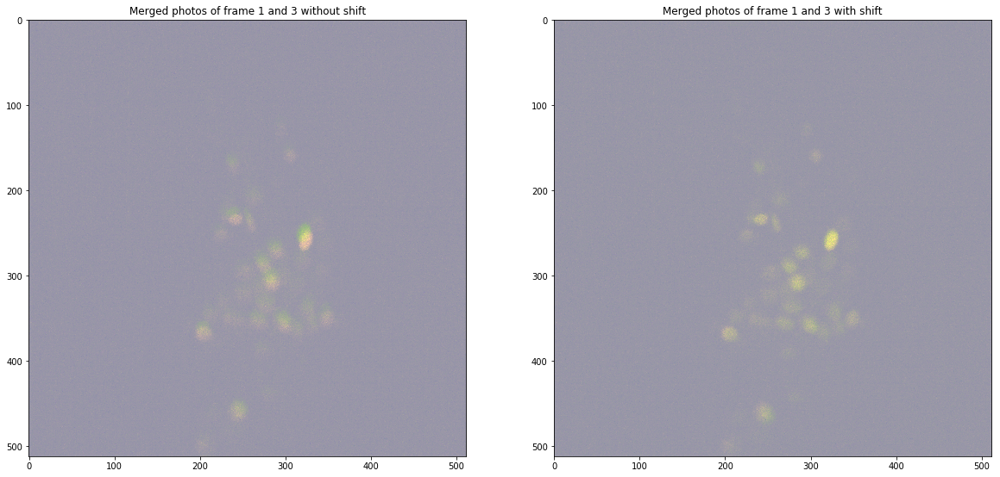

In [30]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("Merged photos of frame 1 and 3 without shift")
plt.imshow(img_1, cmap="spring", alpha=0.5)
plt.imshow(img_2, cmap="summer", alpha=0.5)

plt.subplot(1, 2, 2)
plt.title("Merged photos of frame 1 and 3 with shift")
plt.imshow(img_1_translated, cmap="spring", alpha=0.5)
plt.imshow(img_2, cmap="summer", alpha=0.5)
plt.show()

Seems that it works, lets try measure performance

To prove that, let's check images similarity

Option 1: With scikit image

When comparing images, the mean squared error (MSE)–while simple to implement–is not highly indicative of perceived similarity. Structural similarity aims to address this shortcoming by taking texture into account 

In [31]:
from skimage.metrics import structural_similarity as ssim

In [32]:
ssim(img_1, img_2)

0.06254019149623062

In [33]:
ssim(img_1_translated, img_2)

0.014164035006480212

Option 2: MSE

In [34]:
def mse(x, y):
    return np.linalg.norm(x - y)

In [35]:
mse(img_1, img_2)

4088.348810950455

In [36]:
mse(img_1_translated, img_2)

3628.088889541008

Okay, it works, and ssim provides more objective assessment of that

In [37]:
def align_images(img_1, img_2):
    shift, error, diffphase = register_translation(img_1, img_2, 100)
        
    shift = -1 * shift
    img_1_shifted = fourier_shift(np.fft.fftn(img_1), shift)
    img_1_shifted = np.fft.ifftn(img_1_shifted).real
    
    return img_1_shifted, img_2

### Check how similar is noise on src and trg

In [38]:
volume_1 = get_volume(samples[1], channel=0, frame=0) # samples[1] refers to 5ms, which is noisier than 30ms
volume_2 = get_volume(samples[1], channel=0, frame=2)

In [39]:
level = 10

img_1 = volume_1[level]
img_2 = volume_2[level]

In [40]:
img_1_aligned, img_2_aligned = align_images(img_1, img_2)

In [41]:
merged_image = get_similar_pixels(img_1_aligned, img_2_aligned, threshold=3)

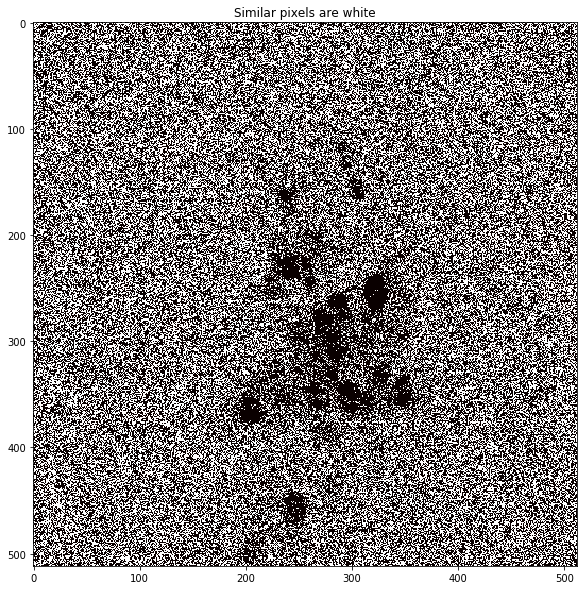

In [42]:
plt.figure(figsize=(10, 10))
plt.imshow(merged_image, cmap="hot")
plt.title("Similar pixels are white")
plt.show()

### Align volumes

In [43]:
def align_volumes(volume_1, volume_2):
    # We will shift slices of volume 1 to suit volume 2
    volume_1_shifted = []
    for img_1, img_2 in zip(volume_1, volume_2):
        img_1_shifted, img_2 = align_images(img_1, img_2)
        volume_1_shifted.append(img_1_shifted)
    return volume_1_shifted, volume_2
        

In [44]:
volume_1_new, volume_2_new = align_volumes(volume_1, volume_2)

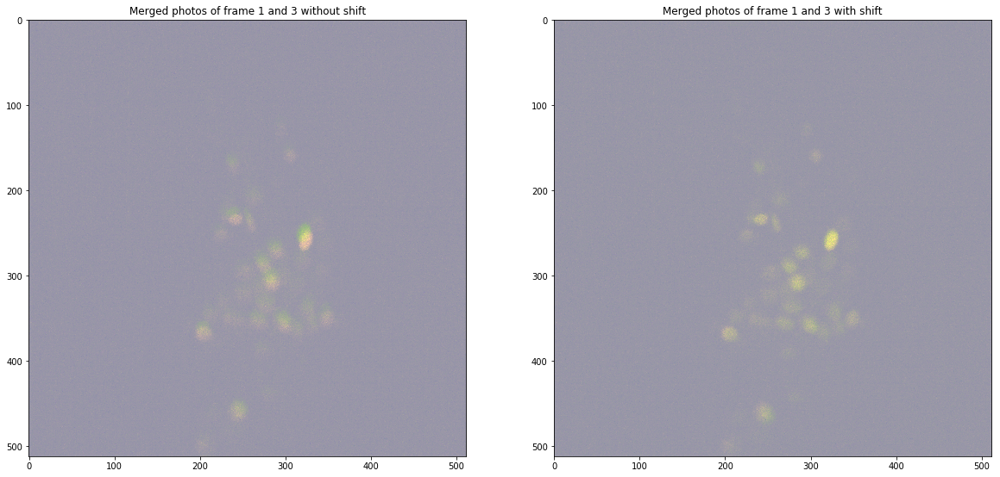

In [45]:
# Check random image pair
level = 10

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("Merged photos of frame 1 and 3 without shift")
plt.imshow(volume_1[level], cmap="spring", alpha=0.5)
plt.imshow(volume_2[level], cmap="summer", alpha=0.5)
plt.subplot(1, 2, 2)
plt.title("Merged photos of frame 1 and 3 with shift")
plt.imshow(volume_1_new[level], cmap="spring", alpha=0.5)
plt.imshow(volume_2_new[level], cmap="summer", alpha=0.5)
plt.show()

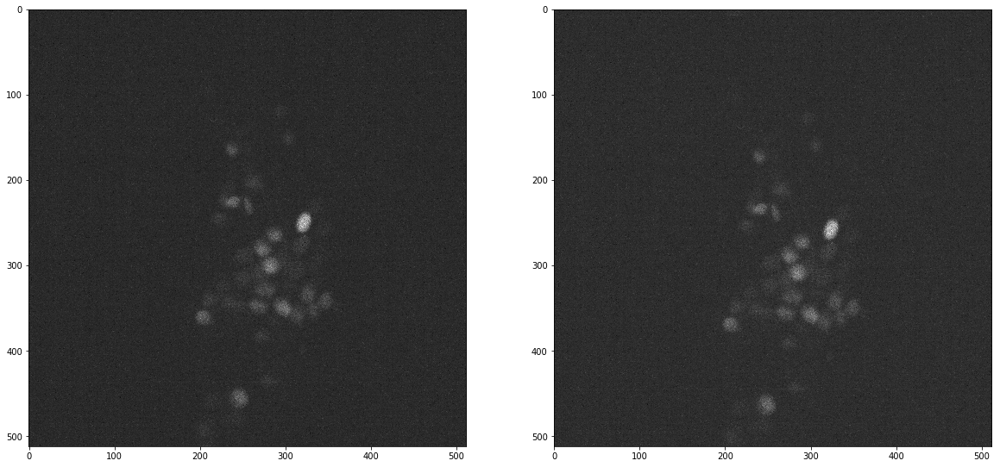

In [46]:
level = 10

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(volume_1[level], cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(volume_1_new[level], cmap="gray")

plt.show()

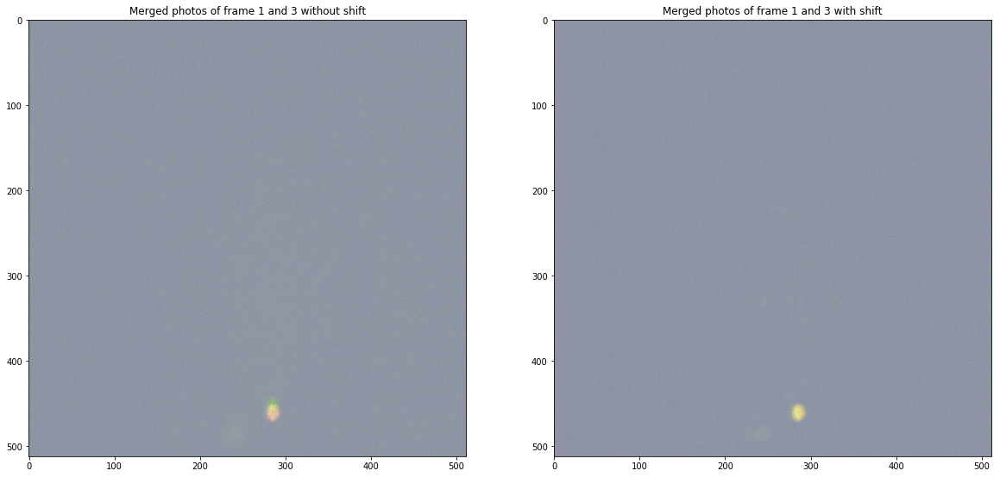

In [47]:
# Check random image pair
level = np.random.choice(range(len(volume_1)))

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("Merged photos of frame 1 and 3 without shift")
plt.imshow(volume_1[level], cmap="spring", alpha=0.5)
plt.imshow(volume_2[level], cmap="summer", alpha=0.5)
plt.subplot(1, 2, 2)
plt.title("Merged photos of frame 1 and 3 with shift")
plt.imshow(volume_1_new[level], cmap="spring", alpha=0.5)
plt.imshow(volume_2_new[level], cmap="summer", alpha=0.5)
plt.show()

### Noisy image classification

Overnoised images are useless for training since they don't contatin any information except of noise. Thus lets try to find such type of images automatically and delete from dataset. We will call overnoised images as noisy, normalnoised images as clean in this section, sorry

In [48]:
# Lets consider 4 instances
img_noisy_1 = volume_1[0]
img_noisy_2 = volume_1[34]
img_clean_1 = volume_1[5]
img_clean_2 = volume_1[25]

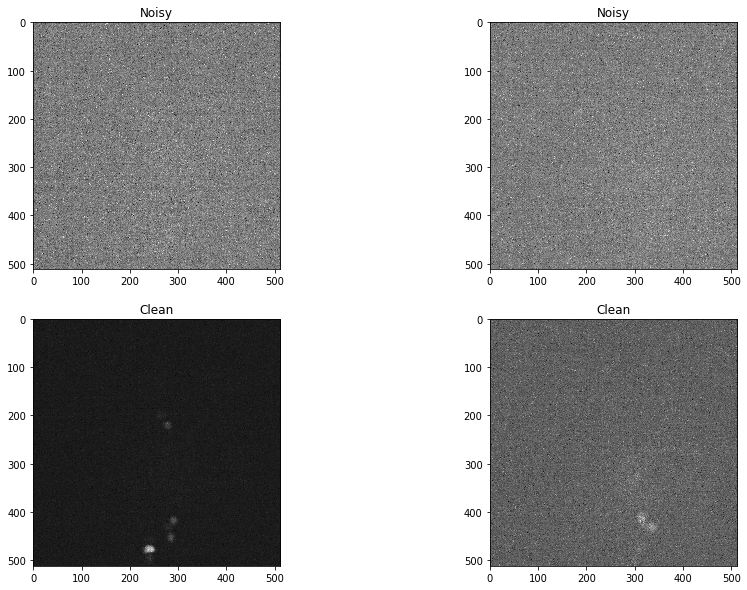

In [49]:
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.title("Noisy")
plt.imshow(img_noisy_1, cmap="gray")

plt.subplot(2, 2, 2)
plt.title("Noisy")
plt.imshow(img_noisy_2, cmap="gray")

plt.subplot(2, 2, 3)
plt.title("Clean")
plt.imshow(img_clean_1, cmap="gray")

plt.subplot(2, 2, 4)
plt.title("Clean")
plt.imshow(img_clean_2, cmap="gray")

plt.show()

In [50]:
from skimage import exposure

In [51]:
images = [img_clean_1, img_clean_2, img_noisy_1, img_noisy_2]
labels = ["clean", "clean", "noisy", "noisy"]

In [52]:
for img, label in zip(images, labels):
    print(label)
    print(exposure.histogram(img, nbins=2))

clean
(array([261973,    171], dtype=int64), array([145.75, 283.25]))
clean
(array([253886,   8258], dtype=int64), array([ 96.5, 135.5]))
noisy
(array([133714, 128430], dtype=int64), array([ 93.5, 120.5]))
noisy
(array([132322, 129822], dtype=int64), array([ 92.5, 121.5]))


Thus we can use value of exposure.histogram to distinguish noisy images

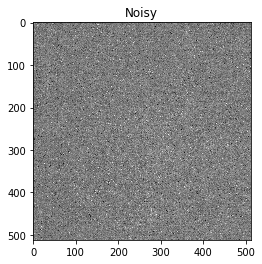

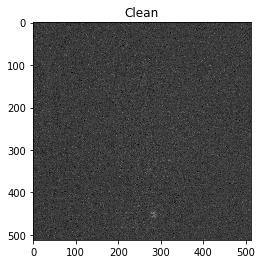

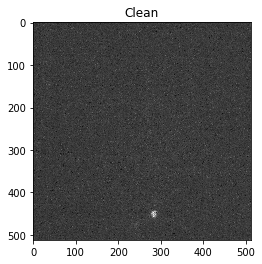

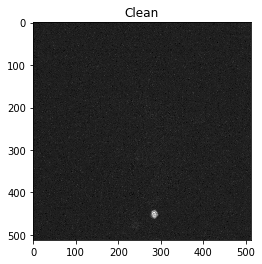

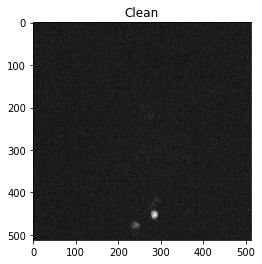

...

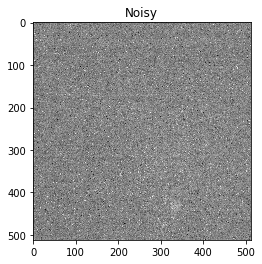

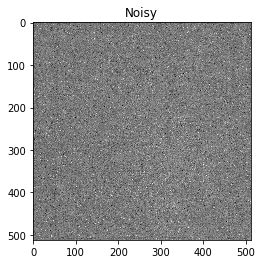

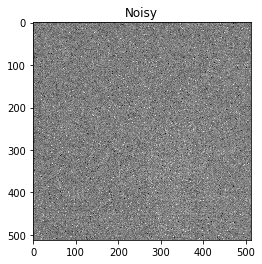

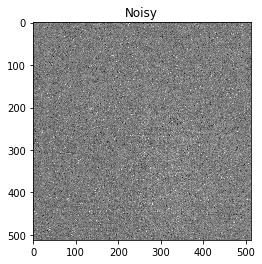

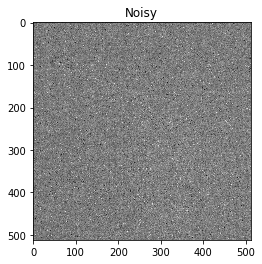

In [53]:
possible_percent_of_bright_pixels = 0.05

for img in volume_1:
    hist = exposure.histogram(img, nbins=2)[0]
    value = hist[1] # Number of bright points. (The less value, the less noise)
    n_pixels = img.shape[0] * img.shape[1]
    label = "Clean" if value < n_pixels * possible_percent_of_bright_pixels else "Noisy"
    plt.title(label)
    plt.imshow(img, cmap="gray")
    plt.show()

Okay, it works there are few neurons and therefore few bright pixels. We can think of this as way to delete obvious (not all) overnoised images. We can use it to decrease work

In [54]:
def is_overnoised(img):
    hist = exposure.histogram(img, nbins=2)[0]
    value = hist[1] # Number of bright points. (The less value, the less noise)
    n_pixels = img.shape[0] * img.shape[1]
    return value > n_pixels * possible_percent_of_bright_pixels

In [55]:
def clean_volumes(volume_1, volume_2):
    volume_1_cleaned = []
    volume_2_cleaned = []
    
    for img_1, img_2 in zip(volume_1, volume_2):
        if is_overnoised(img_1) | is_overnoised(img_2):
            continue
        else:
            volume_1_cleaned.append(img_1)
            volume_2_cleaned.append(img_2)
    return volume_1_cleaned, volume_2_cleaned
        

In [56]:
volume_0 = get_volume(samples[1], channel=0, frame=0)
volume_2 = get_volume(samples[1], channel=0, frame=2)

In [57]:
volume_0_cleaned, volume_2_cleaned = clean_volumes(volume_0, volume_2)

In [58]:
print("Size of volume before: {}, after cleaning: {}".format(len(volume_0), len(volume_0_cleaned)))

Size of volume before: 35, after cleaning: 23


### Data augmentation

Since we reduced number of images when deleted overnoised ones, there is lack of objects in our training set. We can increase it's number by simple data augmentation like mirror.

In [59]:
img = volume_1[10]

In [60]:
img_flipped_1 = np.fliplr(img)
img_flipped_2 = np.flipud(img)
img_flipped_3 = np.fliplr(np.flipud(img))

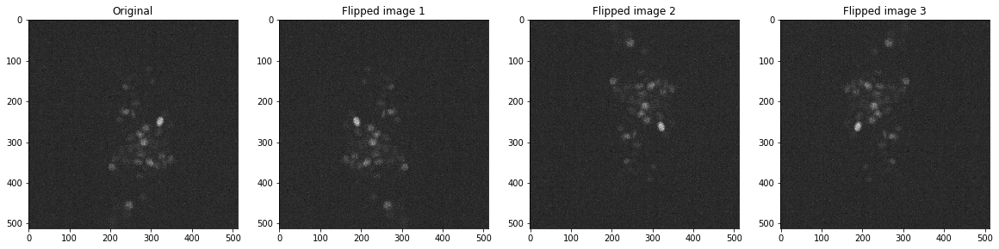

In [61]:
plt.figure(figsize=(20, 20))
plt.subplot(1, 4, 1)
plt.title("Original")
plt.imshow(img, cmap="gray")

plt.subplot(1, 4, 2)
plt.title("Flipped image 1")
plt.imshow(img_flipped_1, cmap="gray")

plt.subplot(1, 4, 3)
plt.title("Flipped image 2")
plt.imshow(img_flipped_2, cmap="gray")

plt.subplot(1, 4, 4)
plt.title("Flipped image 3")
plt.imshow(img_flipped_3, cmap="gray")
plt.show()

In [62]:
def augment_image(img):
    return [img, np.fliplr(img), np.flipud(img), np.fliplr(np.flipud(img))]

In [63]:
def augment_volumes(volume_1, volume_2):
    volume_1_augmented = []
    volume_2_augmented = []
    
    for img_1, img_2 in zip(volume_1, volume_2):
        volume_1_augmented.extend(augment_image(img_1))
        volume_2_augmented.extend(augment_image(img_2))
    return volume_1_augmented, volume_2_augmented

In [64]:
volume_0 = get_volume(samples[1], channel=0, frame=0)
volume_2 = get_volume(samples[1], channel=0, frame=2)

In [65]:
volume_0_augmented, volume_2_augmented = augment_volumes(volume_0, volume_2)

In [66]:
print("Size of volume before: {}, after augmenting: {}".format(len(volume_0), len(volume_0_augmented)))

Size of volume before: 35, after augmenting: 140


### Downsampling images

For reducing training time we will downsample original images

In [67]:
level = 10

img = volume_1[level]

In [68]:
from skimage.transform import rescale

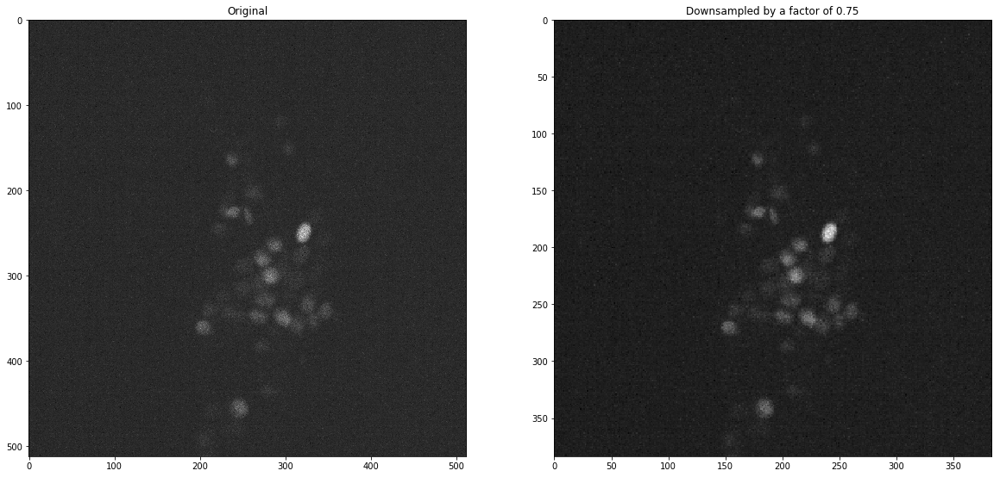

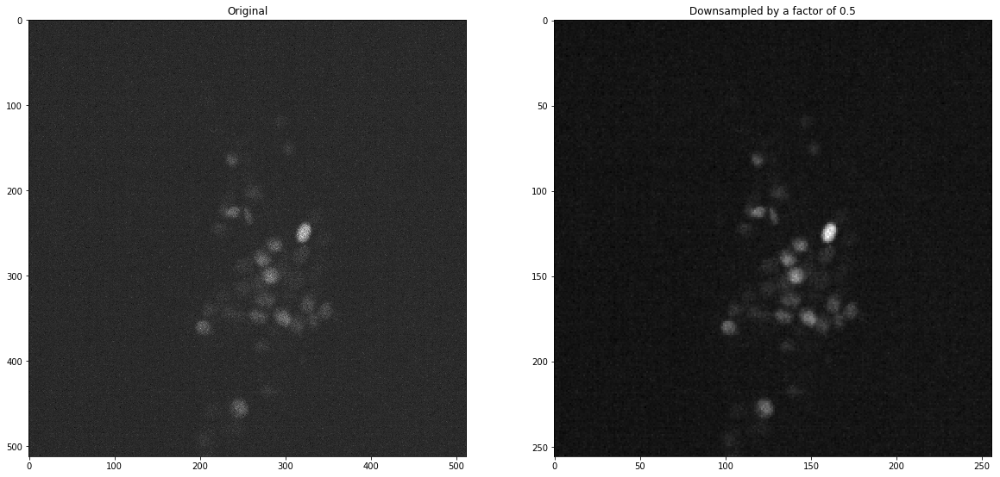

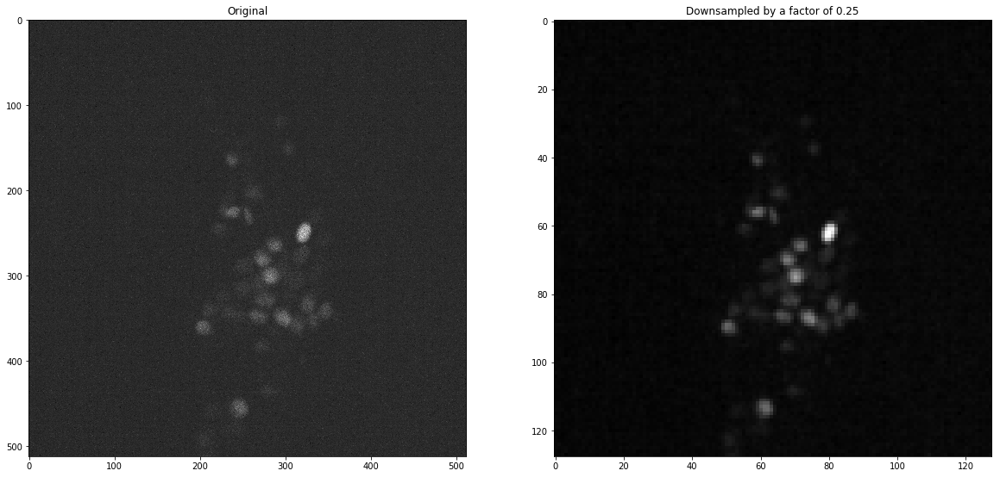

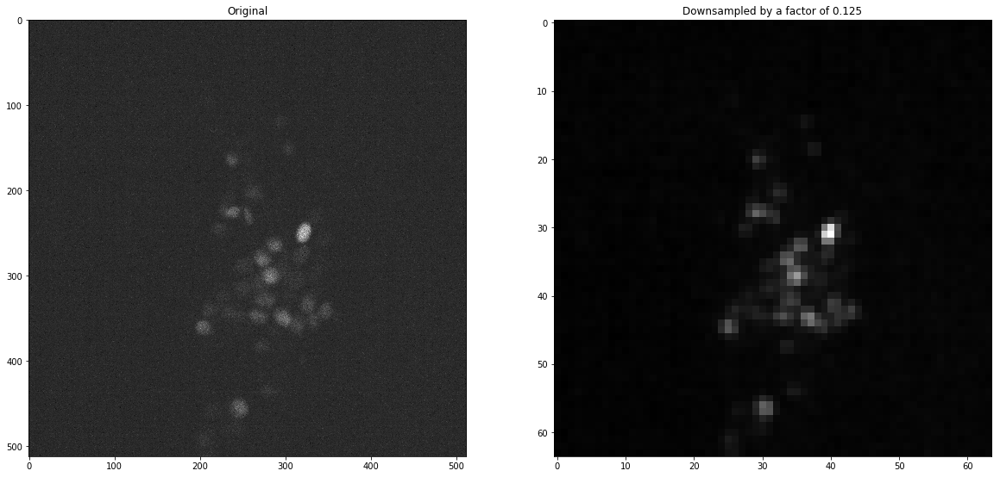

In [69]:
for downsampling_rate in [0.75, 0.5, 0.25, 0.125]:
    img_downsampled = rescale(img, downsampling_rate)
    
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.title("Original")
    plt.imshow(img, cmap="gray")

    plt.subplot(1, 2, 2)
    plt.title("Downsampled by a factor of {}".format(downsampling_rate))
    plt.imshow(img_downsampled, cmap="gray")
    plt.show()

We can see that rescaling by a factor of 2, slightly reduced quality of image, but it's in acceptable limits

### Improving images

#### Lets try to use Histogram Equalization

Here is what it does

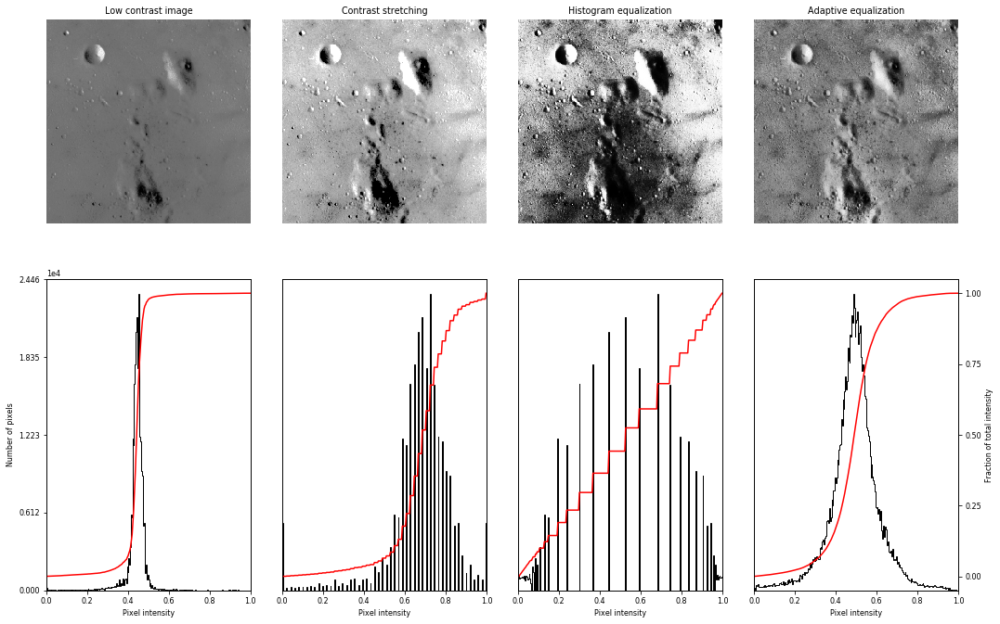

In [70]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

from skimage import data, img_as_float, img_as_uint
from skimage import exposure


matplotlib.rcParams['font.size'] = 8


def plot_img_and_hist(image, axes, bins=256):
    """Plot an image along with its histogram and cumulative histogram.

    """
    image = img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(image, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf


# Load an example image
img = data.moon()

# Contrast stretching
p2, p98 = np.percentile(img, (2, 98))
img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))

# Equalization
img_eq = exposure.equalize_hist(img)

# Adaptive Equalization
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)

# Display results
fig = plt.figure(figsize=(15, 10))
axes = np.zeros((2, 4), dtype=np.object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img, axes[:, 0])
ax_img.set_title('Low contrast image')

y_min, y_max = ax_hist.get_ylim()
ax_hist.set_ylabel('Number of pixels')
ax_hist.set_yticks(np.linspace(0, y_max, 5))

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_rescale, axes[:, 1])
ax_img.set_title('Contrast stretching')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_eq, axes[:, 2])
ax_img.set_title('Histogram equalization')

ax_img, ax_hist, ax_cdf = plot_img_and_hist(img_adapteq, axes[:, 3])
ax_img.set_title('Adaptive equalization')

ax_cdf.set_ylabel('Fraction of total intensity')
ax_cdf.set_yticks(np.linspace(0, 1, 5))

# prevent overlap of y-axis labels
fig.tight_layout()
plt.show()

Our image is

In [71]:
volume = get_volume(samples[1], channel=0, frame=0)
img = volume[10]

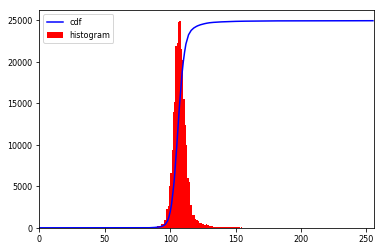

In [72]:
hist,bins = np.histogram(img.flatten(),256,[0,256])

cdf = hist.cumsum()
cdf_normalized = cdf * hist.max()/ cdf.max()

plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

In [73]:
# TODO

### Saving grayscale images

In [74]:
cmap = plt.get_cmap('gray')

In [75]:
color_map = {}
for pixel_value in range(4096):
    color_map[pixel_value] = cmap(pixel_value)[0]

In [76]:
def make_it_grayscale(value):
    return color_map[value] * 256

In [77]:
# TODO

### Save volumes

In [78]:
def save_img(img, fname, scale_factor=None, grayscale=False):
    if scale_factor:
        img = rescale(img, scale_factor)
        
    if grayscale:
        cv2.imwrite(fname, img)
    else:
        plt.imsave(fname, img, cmap="gray")

In [79]:
def save_volume(volume, prefix, suffix, scale_factor=None, grayscale=False):
    for level in range(len(volume)):
        fname = prefix + str(level) + suffix + ".jpg"
        save_img(volume[level], fname, scale_factor, grayscale)

## Main

In [80]:
reader = nd2reader.ND2Reader
data = read_data(reader, PATH)
samples = [file for name, file in data if name.endswith(".nd2")]
filenames = [name for name, _ in data if name.endswith(".nd2")]
print("In total {} files:".format(len(filenames)))
print(*filenames, sep="\n")

In total 9 files:
18112019_SJR5_w1_30ms.nd2
18112019_SJR5_w1_5ms.nd2
18112019_SJR5_w2_30ms.nd2
18112019_SJR5_w2_5ms.nd2
18112019_SJR5_w3_30ms.nd2
18112019_SJR5_w3_5ms.nd2
18112019_SJR5_w4_30ms.nd2
18112019_SJR5_w4_5ms.nd2
18112019_SJR5_w5_30ms.nd2


In [81]:
# file_indices = [ind for ind in range(len(filenames)) if "5ms" in filenames[ind]] # Train only on 5ms images 
file_indices = [ind for ind in range(len(filenames)) if "30ms" in filenames[ind]] # Train only on 30 images 
file_indices

[0, 2, 4, 6, 8]

In [82]:
interested_samples = [samples[ind] for ind in file_indices]
interested_filenames = [filenames[ind] for ind in file_indices]

**Please folowing set settings**

In [83]:
save_as_grayscale = False
scale_factor = None
data_cleaning = False
data_augmentation = False

In [86]:
# If cell returns access denied, run the cell again
dataset_folder = "generated_data_grayscale" if save_as_grayscale else "generated_data_rgb"
if os.path.isdir(dataset_folder):
    shutil.rmtree(dataset_folder, ignore_errors=True)
os.mkdir(dataset_folder)
os.mkdir(dataset_folder + "/train")
os.mkdir(dataset_folder + "/test")

In [87]:
for i, sample in enumerate(interested_samples):
    folder = "train" if i < len(interested_samples) - 1 else "test"  # Last sample will be for test
    
    print("Sample №{}".format(i))
    for channel in [0, 1]:
        for pair_ind, pair in enumerate([[0, 2], [1, 3]]): # Frame pairs
    
            volume_1 = get_volume(sample, channel=channel, frame=pair[0])
            volume_2 = get_volume(sample, channel=channel, frame=pair[1])

            volume_1_aligned, volume_2_aligned = align_volumes(volume_1, volume_2)
            
            if data_cleaning:
                volume_1_cleaned, volume_2_cleaned = clean_volumes(volume_1_aligned, volume_2_aligned)
            else:
                volume_1_cleaned, volume_2_cleaned = volume_1_aligned, volume_2_aligned
            
            if folder == "train" and data_augmentation:
                volume_1_augmented, volume_2_augmented = augment_volumes(volume_1_cleaned, volume_2_cleaned)
            else:
                # We don't need augmentation for test
                volume_1_augmented, volume_2_augmented = volume_1_cleaned, volume_2_cleaned
                
            
            assert(len(volume_1_augmented) == len(volume_2_augmented))
            print("Channel: {}, Frames: {}, Number of samples: {}".format(channel, 
                                                                          pair,
                                                                          len(volume_1_augmented)))
            
            prefix = dataset_folder + "/" + folder + "/s" + str(i) + "f" + str(pair_ind) + "c" + str(channel) + "_"
            save_volume(volume_1_augmented, prefix=prefix, suffix="src", scale_factor=scale_factor, grayscale=save_as_grayscale)
            save_volume(volume_2_augmented, prefix=prefix, suffix="trg", scale_factor=scale_factor, grayscale=save_as_grayscale)

Sample №0
Channel: 0, Frames: [0, 2], Number of samples: 35
Channel: 0, Frames: [1, 3], Number of samples: 35
Channel: 1, Frames: [0, 2], Number of samples: 35
Channel: 1, Frames: [1, 3], Number of samples: 35
Sample №1
Channel: 0, Frames: [0, 2], Number of samples: 35
Channel: 0, Frames: [1, 3], Number of samples: 35
Channel: 1, Frames: [0, 2], Number of samples: 35
Channel: 1, Frames: [1, 3], Number of samples: 35
Sample №2
Channel: 0, Frames: [0, 2], Number of samples: 35
Channel: 0, Frames: [1, 3], Number of samples: 35
Channel: 1, Frames: [0, 2], Number of samples: 35
Channel: 1, Frames: [1, 3], Number of samples: 35
Sample №3
Channel: 0, Frames: [0, 2], Number of samples: 35
Channel: 0, Frames: [1, 3], Number of samples: 35
Channel: 1, Frames: [0, 2], Number of samples: 35
Channel: 1, Frames: [1, 3], Number of samples: 35
Sample №4
Channel: 0, Frames: [0, 2], Number of samples: 35
Channel: 0, Frames: [1, 3], Number of samples: 35
Channel: 1, Frames: [0, 2], Number of samples: 35


## Analyse results

In [ ]:
# TODO

In [ ]:
bad_example = plt.imread("bad_example.png")

In [ ]:
plt.imshow(bad_example)

In [ ]:
mse(bad_example_input, bad_example_denoised)

In [ ]:
ssim(bad_example_input, bad_example_denoised)

# EXTRA

## Denoising with scikit - Luke's version

In [27]:
import matplotlib.pyplot as plt

from skimage.restoration import (denoise_tv_bregman, denoise_tv_chambolle, denoise_bilateral,
                                 denoise_wavelet, estimate_sigma)
from skimage import data, img_as_float
from skimage.util import random_noise

In [31]:
sample_images = [img_1, img_2, img_3]

In [50]:
def plot_img_before_after(images, transformer, transformation_name, figsize_x, figsize_y):
    fig, ax = plt.subplots(nrows=len(images), ncols=2, 
                           figsize=(figsize_x,figsize_y), sharex=True, sharey=True)
    plt.gray()
    
    for i in range(len(images)):
        ax[i, 0].imshow(images[i])
        ax[i, 0].axis('off')
        ax[i, 0].set_title('original')
        ax[i, 1].imshow(transformer(images[i]))
        ax[i, 1].axis('off')
        ax[i, 1].set_title(transformation_name)

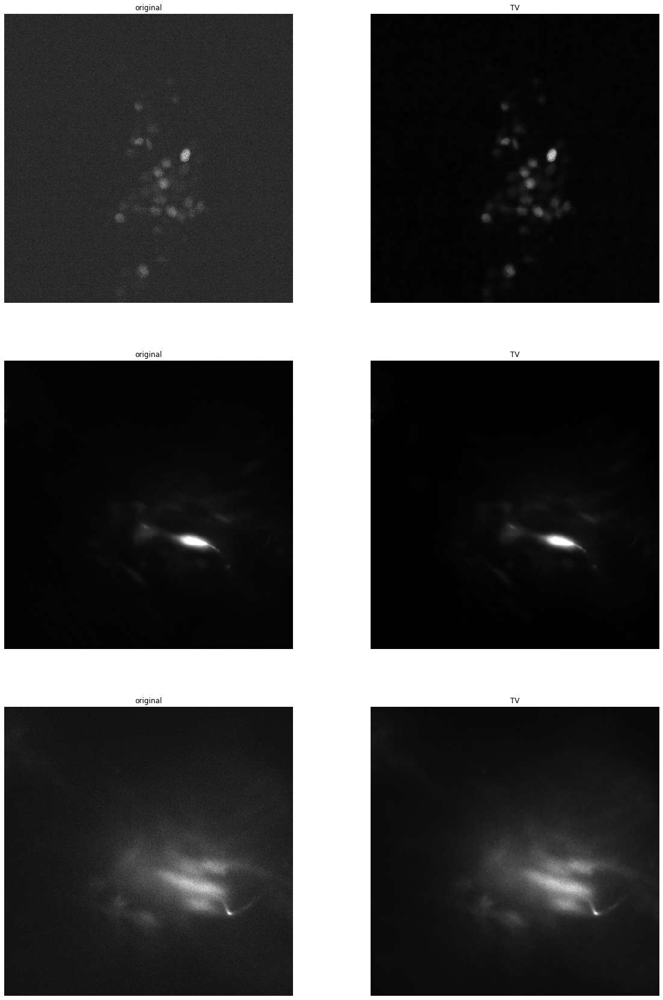

In [61]:
plot_img_before_after(sample_images, (lambda image: denoise_tv_chambolle(image, weight=10, multichannel=False)), 'TV', 20, 30)

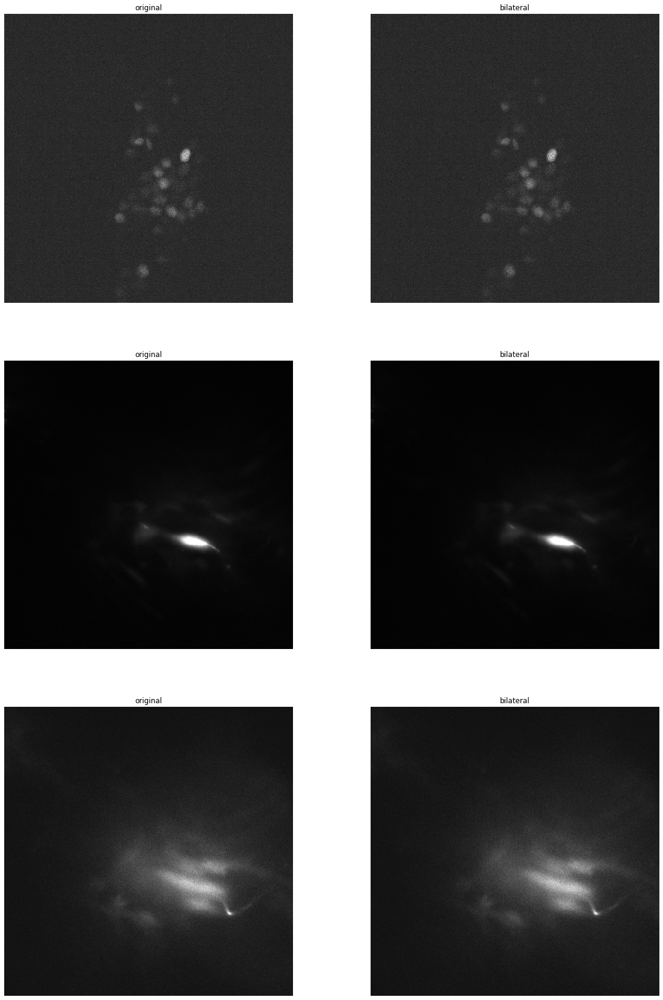

In [58]:
plot_img_before_after(sample_images, lambda image: denoise_bilateral(image, sigma_color=0.05, sigma_spatial=15, multichannel=False), 'bilateral', 20, 30)

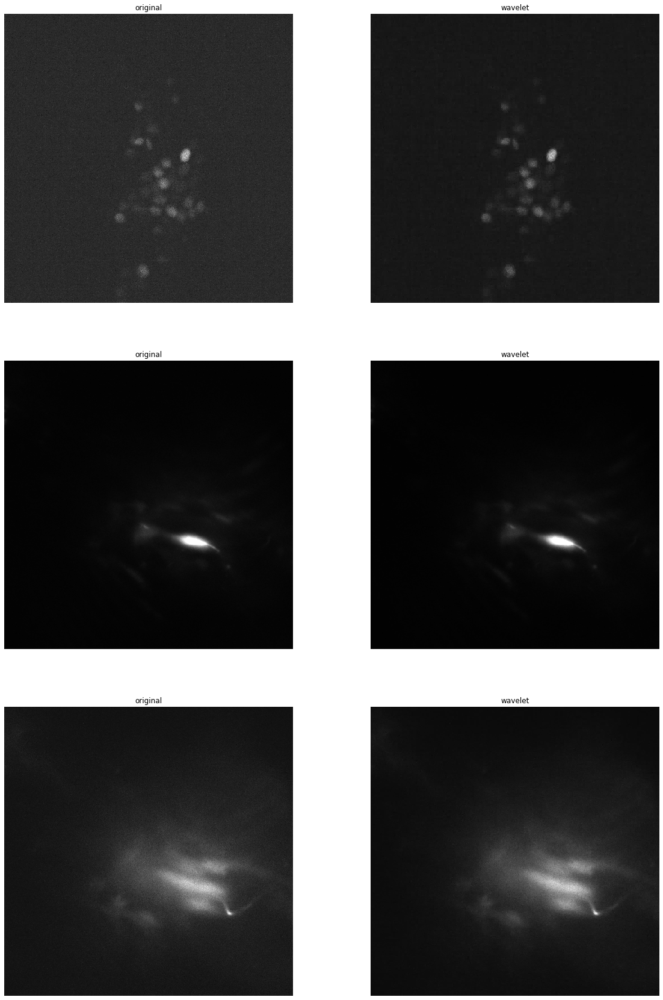

In [67]:
plot_img_before_after(sample_images, lambda image: denoise_wavelet(image, multichannel=False, rescale_sigma=True), 'wavelet', 20, 30)

In [77]:
from skimage import exposure, img_as_float
import numpy as np

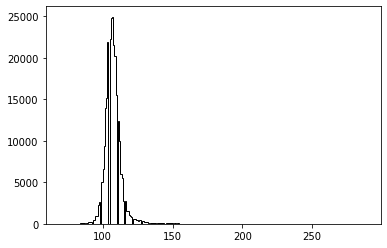

In [90]:
fig = plt.hist(img_1.ravel(), bins=256, histtype='step', color='black')

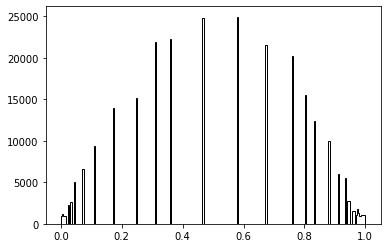

In [91]:
fig = plt.hist(exposure.equalize_hist(img_1).ravel(), bins=256, histtype='step', color='black')

In [ ]:
plot_img_before_after(sample_images, exposure.equalize_hist, 'Histogram equalization', 20, 30)

In [96]:
from sklearn import preprocessing

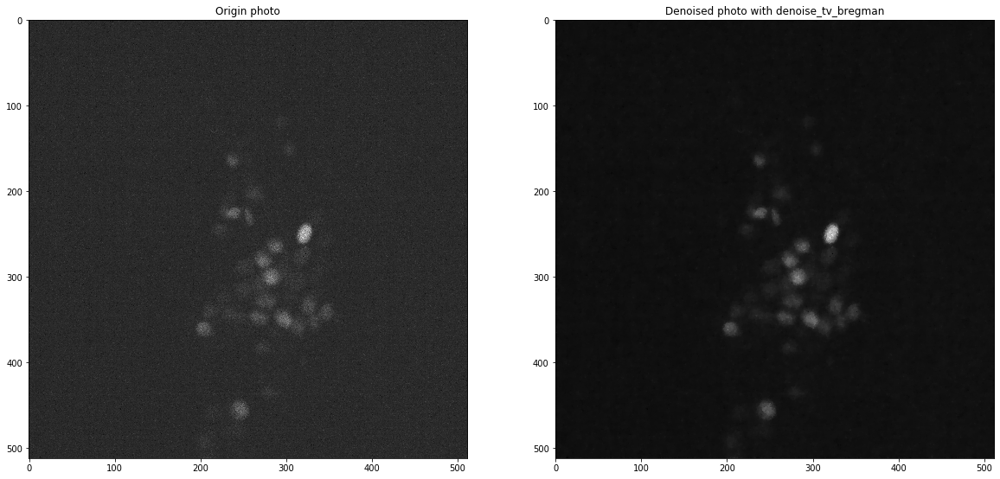

In [66]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("Origin photo")
plt.imshow(img_1, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Denoised photo with denoise_tv_bregman")
# The smaller the weight, the more denoising (at the expense of less similarity to the input).
img_denoised = denoise_tv_bregman(img_1, weight=0.1) 
plt.imshow(img_denoised, cmap="gray")
plt.show()

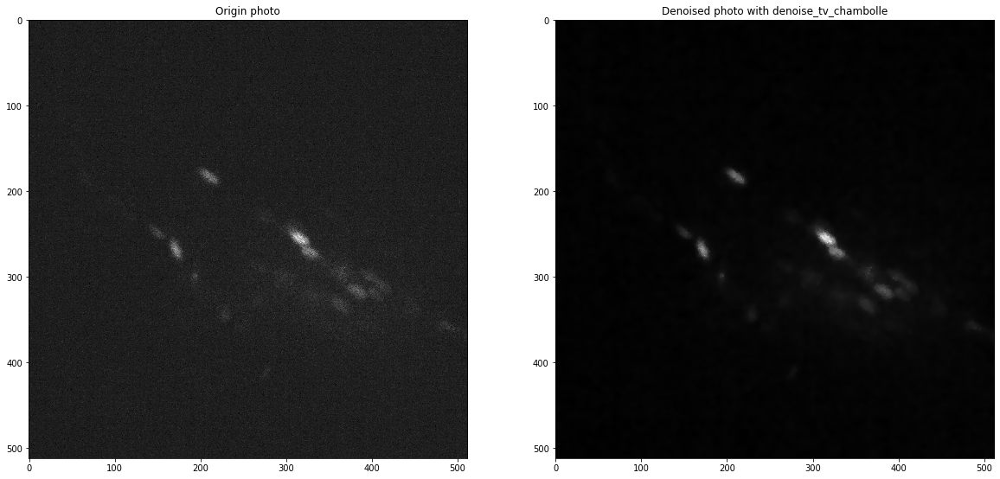

In [16]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("Origin photo")
plt.imshow(img_1, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Denoised photo with denoise_tv_chambolle")
# The greater weight, the more denoising (at the expense of fidelity to input)
img_denoised = denoise_tv_chambolle(img_1, weight=10)
plt.imshow(img_denoised, cmap="gray")
plt.show()

## Denoising with scikit - Oganes's work

In [ ]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("Origin photo")
plt.imshow(img_1, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Denoised photo with denoise_bilateral")
img_denoised = denoise_bilateral(img_1, 
                                 # A larger value results in averaging of pixels with larger radiometric differences.
                                 sigma_color=10, 
                                 # A larger value results in averaging of pixels with larger spatial differences.
                                 sigma_spatial=10) 
plt.imshow(img_denoised, cmap="gray")
plt.show()

In [ ]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("Origin photo")
plt.imshow(img_1, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Denoised photo with denoise_wavelet")
img_denoised = denoise_wavelet(img_1, rescale_sigma=True)
plt.imshow(img_denoised, cmap="gray")
plt.show()

Let's check that we can denoise all images with the same value of parameters

In [ ]:
for img in volume_1:
    plt.figure(figsize=(20, 6))
    plt.subplot(1, 2, 1)
    plt.title("Origin photo")
    plt.imshow(img, cmap="gray")

    plt.subplot(1, 2, 2)
    plt.title("Denoised photo with denoise_tv_chambolle")
    # The greater weight, the more denoising (at the expense of fidelity to input)
    img_denoised = denoise_tv_chambolle(img, weight=7)
    plt.imshow(img_denoised, cmap="gray")
    plt.show()

okay, it doesn't work properly on every image

### Image manipulations

Feature based methods have some advantages over pixel based methods when we are trying to register pictures that have been shoot under different lighting conditions or exposition times, or when the images overlap only partially. On the other hand, the main advantage of pixel-based methods when compared to feature based methods is their better precision for some pictures (those shoot under similar lighting conditions and that have a significative overlap), due to the fact that we are using all the information available in the image, which allows us to achieve subpixel accuracy. This is particularly important for certain applications like multi-frame denoising or super-resolution.

In [ ]:
img = volume_1[10]
plt.figure(figsize=(10, 10))
plt.imshow(img, cmap="gray")
plt.show()

Let's scale image to [0, 255] for folowing binarization

In [ ]:
print_matrix_stat(img)

In [ ]:
img_scaled = (img - img.min()) / (img.max() - img.min()) * 255

In [ ]:
print_matrix_stat(img_scaled)

In [ ]:
threshold = img_scaled.mean() * 1.1

In [ ]:
ret, img_binarized = cv2.threshold(img_scaled, threshold, 255, cv2.THRESH_BINARY)

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(img_binarized, cmap="gray")
plt.title("Binarized image")
plt.show()

One approach to get rid of white noise is using morhological transformations, namely erosion folowed by dilation. The only thing is to find optimum size of kernel

In [ ]:
kernel_erosion = np.ones((3, 3), np.uint8)
erosion = cv2.erode(img_binarized, kernel_erosion, iterations=1)

kernel_dilation = np.ones((3, 3), np.uint8)
dilation = cv2.dilate(erosion, kernel_dilation, iterations=2)

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("Binarized image")
plt.imshow(img_binarized, cmap="gray")
plt.subplot(1, 2, 2)
plt.title("Image after erosion and dilation")
plt.imshow(dilation, cmap="gray")
plt.show()

Let's treat final image as mask

In [ ]:
mask = dilation
mask[mask==255]=1

In [ ]:
plt.imshow(mask, cmap="gray")

In [ ]:
u, c = np.unique(mask, return_counts=True)
u

In [ ]:
img_proccessed = img * mask

In [ ]:
print_matrix_stat(img_proccessed)

In [ ]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title("Default image")
plt.imshow(img, cmap="gray")
plt.subplot(1, 2, 2)
plt.title("Image proccessed")
plt.imshow(img_proccessed, cmap="gray")
plt.show()